Let's import required libraries

In [1]:
import numpy as  np
import pandas as pd
import tensorflow as tf
from random import shuffle
import matplotlib.pyplot as plt
from google.colab import files


Now it's time to read data from default path

In [3]:
files.upload()

Saving ferdosi.txt to ferdosi.txt


{'ferdosi.txt': b'\xd8\xa8\xd9\x87 \xd9\x86\xd8\xa7\xd9\x85 \xd8\xae\xd8\xaf\xd8\xa7\xd9\x88\xd9\x86\xd8\xaf \xd8\xac\xd8\xa7\xd9\x86 \xd9\x88 \xd8\xae\xd8\xb1\xd8\xaf , \xda\xa9\xd8\xb2\xdb\x8c\xd9\x86 \xd8\xa8\xd8\xb1\xd8\xaa\xd8\xb1 \xd8\xa7\xd9\x86\xd8\xaf\xdb\x8c\xd8\xb4\xd9\x87 \xd8\xa8\xd8\xb1\xd9\x86\xda\xaf\xd8\xb0\xd8\xb1\xd8\xaf\r\n\xd8\xae\xd8\xaf\xd8\xa7\xd9\x88\xd9\x86\xd8\xaf \xd9\x86\xd8\xa7\xd9\x85 \xd9\x88 \xd8\xae\xd8\xaf\xd8\xa7\xd9\x88\xd9\x86\xd8\xaf \xd8\xac\xd8\xa7\xdb\x8c , \xd8\xae\xd8\xaf\xd8\xa7\xd9\x88\xd9\x86\xd8\xaf \xd8\xb1\xd9\x88\xd8\xb2\xdb\x8c \xd8\xaf\xd9\x87 \xd8\xb1\xd9\x87\xd9\x86\xd9\x85\xd8\xa7\xdb\x8c\r\n\xd8\xae\xd8\xaf\xd8\xa7\xd9\x88\xd9\x86\xd8\xaf \xda\xa9\xdb\x8c\xd9\x88\xd8\xa7\xd9\x86 \xd9\x88 \xda\xaf\xd8\xb1\xd8\xaf\xd8\xa7\xd9\x86 \xd8\xb3\xd9\xbe\xd9\x87\xd8\xb1 , \xd9\x81\xd8\xb1\xd9\x88\xd8\xb2\xd9\x86\xd8\xaf\xd9\x87 \xd9\x85\xd8\xa7\xd9\x87 \xd9\x88 \xd9\x86\xd8\xa7\xd9\x87\xdb\x8c\xd8\xaf \xd9\x88 \xd9\x85\xd9\x87\xd8\xb1\r\n\

**Reseting** graph 

In [0]:
tf.reset_default_graph()

Cleaning , **preparing** and separating data 

In [0]:
beytha = np.loadtxt('ferdosi.txt', delimiter='\n', dtype=str, encoding='utf-8')
harf_ezafeh = { 'بر', 'برای', 'تا', 'که', 'و', 'ز', ' ', '', 'را','از', 'در', 'به', 'با'}
words = set()
sntc = []
for Beyt in beytha:
    first_m, second_m = Beyt.split(',')
    first_m = first_m.rstrip()
    second_m = second_m.lstrip()
    beyt = first_m + ' ' + second_m
    beyt_words = []
    for word in beyt.split(' '):
        if word not in harf_ezafeh:
            if word not in words:
                words.add(word)
            beyt_words.append(word)
    sntc.append(beyt_words)

Finding **neighbourhood** of words window size here is **5**

In [0]:
word2int = {}
for i,word in enumerate(words):
    word2int[word] = i    
window = 5
data = []
Data = []
Data_in = []
label = []
for sentence in sntc:
    for idx, word in enumerate(sentence):
        for neighbor in sentence[max(idx - window, 0) : min(idx + window, len(sentence)) + 1] : 
            if neighbor != word:
                data.append([word, neighbor])
                Data.append([word2int[word], word2int[neighbor]])
                Data_in.append(word2int[word])
                label.append(word2int[neighbor])
neighbourhood= pd.DataFrame(data, columns = ['input', 'label'])

Making each of above as **one** **hot** vector

In [0]:
def to_one_hot(index):
    one_hot_encoding = np.zeros(one_hot_len)
    one_hot_encoding[index] = 1
    return one_hot_encoding
def chunker(seq, size):
    return (seq[i:i + size] for i in range(0, len(seq), size))

Let's define **structure** of network

In [0]:
EMBEDDING_DIM = 25 
one_hot_len = len(words)
tf.reset_default_graph()
x = tf.placeholder(tf.int32, (None, ))
y = tf.placeholder(tf.float32, shape=(None, one_hot_len))
#####################################################layer which illustrates word vector eventually##########################################################
W1 = tf.get_variable(name='W1', shape=(one_hot_len, EMBEDDING_DIM), dtype=tf.float32, initializer=tf.random_normal_initializer(0, 1, seed=1))
b1 = tf.get_variable(name='b1', shape=(EMBEDDING_DIM,), dtype=tf.float32, initializer=tf.initializers.zeros())
hidden_layer = tf.add(tf.gather(W1, indices=x, axis=0), b1)
W2 = tf.get_variable(name='W2', shape=(EMBEDDING_DIM, one_hot_len), dtype=tf.float32, initializer=tf.random_normal_initializer(0, 1, seed=1))
b2 = tf.get_variable(name='b2', shape=(one_hot_len,), dtype=tf.float32, initializer=tf.initializers.zeros())
prediction = tf.nn.softmax(tf.nn.xw_plus_b(hidden_layer, W2, b2))
loss = tf.reduce_mean(-tf.reduce_sum(y * tf.log(prediction), reduction_indices=[1]))
train_op = tf.train.AdamOptimizer(0.01).minimize(loss)

Training the mentioned **network**

In [23]:
#################################### Note: X is input and Y is tarrget ###############################
epochs = 2
batch_size = 256
with tf.name_scope("Loss"):
    summary_loss = tf.summary.scalar("train_loss", loss)
loss_merged_summaries = tf.summary.merge([summary_loss])
sess = tf.Session()
init = tf.global_variables_initializer()
summary = tf.summary.FileWriter("Logs/skip_gram", sess.graph)
sess.run(init) 
tr_loss_vec = []
shuffle(Data)
for epoch in range(epochs):
    print('epoch '+ str(epoch) +10*' ######')
    i = 0
    for chunk in chunker(Data,batch_size):
        X = [] 
        Y = [] 
        ch = np.asarray(chunk)
        for j in ch:
            X.append( j[0] )
            Y.append(to_one_hot( j[1] ))
        x_tr = np.asarray(X)
        y_tr = np.asarray(Y)
        tr_loss, _, loss_summ = sess.run([loss, train_op, loss_merged_summaries], feed_dict={x: x_tr, y: y_tr})
        summary.add_summary(loss_summ, i+epoch*int(len(Data)/batch_size))
        if i % 500 == 0:
            tr_loss_vec.append(tr_loss)
            print('iteration '+str(i)+' loss is : ', tr_loss)
        i += 1

epoch 0 ###### ###### ###### ###### ###### ###### ###### ###### ###### ######
iteration 0 loss is :  20.188179
iteration 500 loss is :  8.702229
iteration 1000 loss is :  8.061992
iteration 1500 loss is :  7.5022445
iteration 2000 loss is :  7.364812
iteration 2500 loss is :  7.636699
iteration 3000 loss is :  7.4676714
iteration 3500 loss is :  7.3994756
iteration 4000 loss is :  7.5692186
iteration 4500 loss is :  7.261201
iteration 5000 loss is :  7.5049715
iteration 5500 loss is :  7.5929327
iteration 6000 loss is :  7.243972
iteration 6500 loss is :  7.4842997
iteration 7000 loss is :  7.368279
iteration 7500 loss is :  7.5014157
iteration 8000 loss is :  7.4965944
iteration 8500 loss is :  7.303337
iteration 9000 loss is :  7.1746454
iteration 9500 loss is :  7.4015546
iteration 10000 loss is :  7.3164263
iteration 10500 loss is :  7.122033
iteration 11000 loss is :  7.280116
iteration 11500 loss is :  7.4210477
iteration 12000 loss is :  7.392715
epoch 1 ###### ###### ###### ###

Text(0, 0.5, 'train_loss')

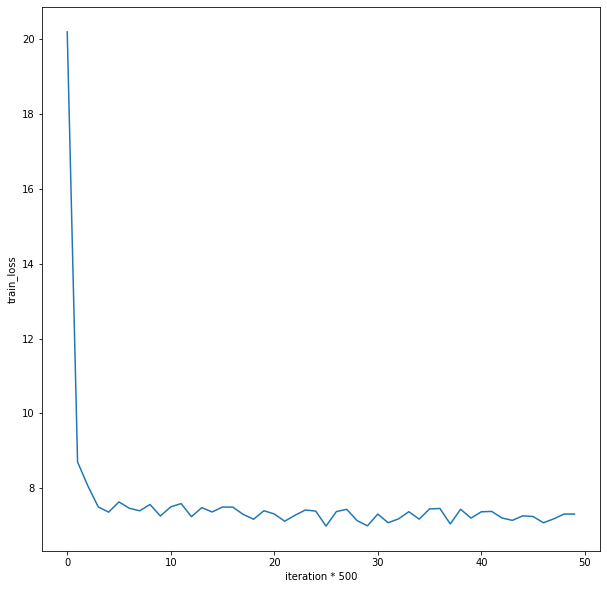

In [25]:
plt.figure(figsize=(10,10))
plt.plot(tr_loss_vec)
plt.xlabel('iteration * 500')
plt.ylabel('train_loss')

In [33]:
x_1 = tf.placeholder(tf.float32, shape=(EMBEDDING_DIM,), name="input_placeholder_x_1")
x_2 = tf.placeholder(tf.float32, shape=(EMBEDDING_DIM,), name="input_placeholder_x_2")
norm_x_1 = tf.nn.l2_normalize(x_1,0)        
norm_x_2 = tf.nn.l2_normalize(x_2,0)
cosine_similarity=tf.reduce_sum(tf.multiply(norm_x_1,norm_x_2))
sess1=tf.Session()
word_simil_test = ['گلاب','سیستان','ایران','رستم','خردمند']
neighbours = pd.DataFrame(columns=['word_simil_test', '1_neighbour','2_neighbour','3_neighbour','4_neighbour','5_neighbour','6_neighbour','7_neighbour','8_neighbour','9_neighbour','10_neighbour']) 
count = 0
for w in word_simil_test:
    run1 = sess.run([hidden_layer], feed_dict={x: [word2int[w]]})
    adj_dist = []
    adj_words = []
    for i in range(len(words)):
        run2 = sess.run([hidden_layer], feed_dict={x: [i]})
        cosine_sim=sess1.run(cosine_similarity,feed_dict={x_1:np.squeeze(run1[0]),x_2:np.squeeze(run2[0])})
        adj_dist.append(cosine_sim)
    adj_dist = np.asarray(adj_dist)
    ind = adj_dist.argsort()[-10:][::-1]
    for j in ind:
        adj_words.append(list(words)[j])
    neighbours.loc[count]=[w]+adj_words
    count+=1
neighbours.head()

,word_simil_test,1_neighbour,2_neighbour,3_neighbour,4_neighbour,5_neighbour,6_neighbour,7_neighbour,8_neighbour,9_neighbour,10_neighbour
0,گلاب,گلاب,ناب,شمعی,بویا,جامی,سرتاجداران,خوردنش,ماء,ماری,نشستنگه
1,سیستان,سیستان,بامی,روید,ببدره,وبنه,بهندوستان,پرسیدمت,فروزش,چنانک,فزایست
2,ایران,ایران,بیاری,بایران,توران,ختن,چین,شهر,خراسان,سرفرازان,بنزدیک
3,رستم,رستم,بیاودر,بگیو,بپیران,گیو,هومان,نیو,بیژن,گودرز,برهام
4,خردمند,خردمند,بادانش,راد,بشخودنی,وانجام,بیناو,بارای,ودانا,هنرمند,نوییان


At the end **gensim** is used to find similar adjacent words by cosine similarity

In [0]:
from gensim.models import Word2Vec
word2vec = Word2Vec(sntc, size=25, window=5, min_count=1, workers=4)

In [43]:
word2vec.wv.most_similar('رستم')

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('بیژن', 0.9732615351676941),
 ('گودرز', 0.9512680768966675),
 ('منذر', 0.948672354221344),
 ('اذرمهان', 0.9482123255729675),
 ('هومان', 0.9428349137306213),
 ('گرگین', 0.9424571394920349),
 ('خراد', 0.9334297180175781),
 ('گیو', 0.9324767589569092),
 ('پیران', 0.9295399188995361),
 ('پشوتن', 0.9283220171928406)]

In [39]:
word2vec.wv.most_similar('گلاب')

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('ناب', 0.9889268279075623),
 ('پراگند', 0.9857693314552307),
 ('نار', 0.9818269610404968),
 ('بویا', 0.9812527298927307),
 ('همچون', 0.9801726937294006),
 ('تگرگ', 0.9799711108207703),
 ('براویختند', 0.9779530167579651),
 ('دهن', 0.9773155450820923),
 ('پیراهن', 0.9768480658531189),
 ('الماس', 0.9765994548797607)]

In [40]:
word2vec.wv.most_similar('سیستان')

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('خراسان', 0.9790148138999939),
 ('سقلاب', 0.9772952198982239),
 ('زابلستان', 0.9772876501083374),
 ('زینهاری', 0.9758538007736206),
 ('بامی', 0.9751833081245422),
 ('هیتال', 0.9735563397407532),
 ('مازندران', 0.9733219146728516),
 ('روید', 0.972202479839325),
 ('دمار', 0.9710649847984314),
 ('یافتیم', 0.970090925693512)]

In [41]:
word2vec.wv.most_similar('ایران')

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('توران', 0.9282890558242798),
 ('چین', 0.882876992225647),
 ('روم', 0.8772547245025635),
 ('شهر', 0.855289876461029),
 ('ترکان', 0.8194497227668762),
 ('گلگله', 0.8123096823692322),
 ('مرز', 0.8122778534889221),
 ('تنگست', 0.8108155131340027),
 ('هند', 0.8019152879714966),
 ('شدندش', 0.7998319268226624)]

In [42]:
word2vec.wv.most_similar('خردمند')

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('پسر', 0.9596044421195984),
 ('بدساز', 0.9429634213447571),
 ('پذیر', 0.9349377155303955),
 ('پژوه', 0.9339701533317566),
 ('گویمش', 0.9306830167770386),
 ('انوشه', 0.9243719577789307),
 ('پرخرد', 0.9213787317276001),
 ('یاروپشت', 0.9192596077919006),
 ('راد', 0.919158935546875),
 ('ناسازگار', 0.9188781976699829)]